#**M2 Wisconsin Breast Cancer Dataset**
This notebook focuses on EDA of the Wisconsin Breast Cancer dataset.
The features of the dataset are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. The target indicated whether the mass is malignant or benign.
The data is available here: https://archive.ics.uci.edu/ml/datasets/breast+cancer+wisconsin+(diagnostic)

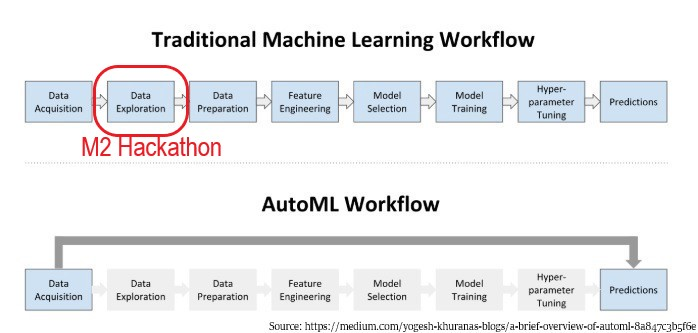

#**Table of Contents**
* Business Problem
* BLUF
* Libraries
* Data
* Missing Values
* Duplicates
* Descriptive Statistics
* Interactive Visualizations
* Automated Visualizations
* Conclusions

#**Business Problem** 
Pathology.AI is has a new healthcare analytics division that focuses on mining patient data to predict disease outcomes for patients affected by breast cancer. They have been tasked to build a model that can predict whether a tissue sample belonging to a patient is cancerous (malignant) or not (benign) using parameters extracted from the cells of the tissue. Described below is a clinical workflow of how the data obtained can be utilized by the hospital.

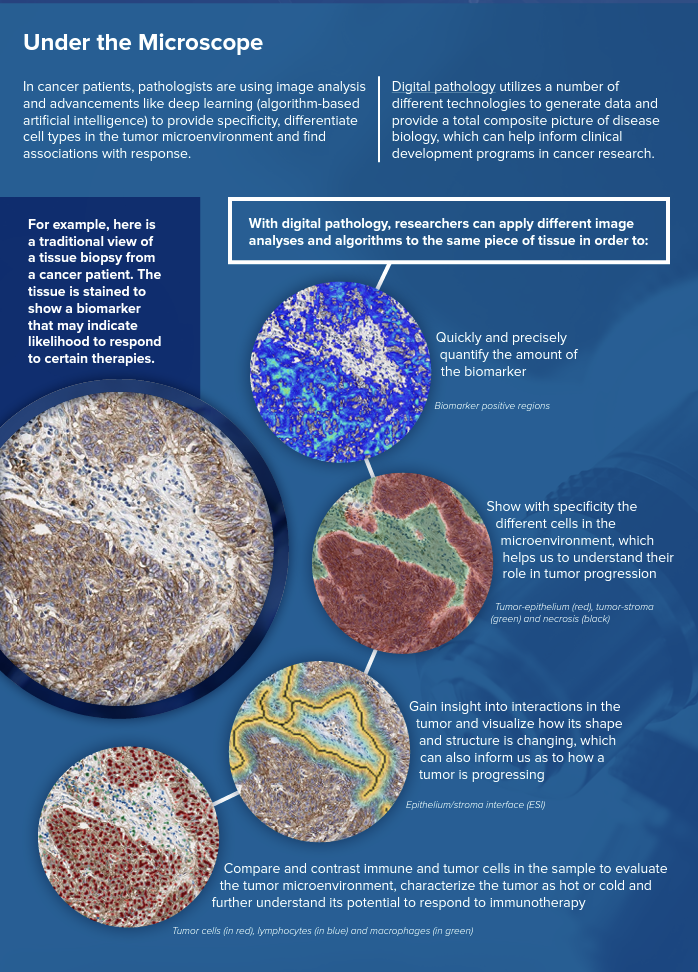

All image rights are owned by Bristol-Myers-Squibb

https://www.bms.com/assets/bms/us/en-us/pdf/digital-pathology-infographic.pdf

Using Digital Pathology, features of individual cells are extracted for every patient's tissue. This data can be used to construct a data dictionary of several patients. Using this data, we can construct a machine learning model to predict whether a patient has a cancerous tissue or not. The business problem in this notebook is to explore the Wisconsin breast cancer data with a view to a) identifying data preparation needs for development of a machine learning classifier that can classify tissue samples, and b) form inferences about relationships between the features and identify possible strong predictors of malignancy.

#**BLUF** 
(Bottom Line Up Front)

The dataset is tiny with only 568 instances (and 30 predictors). There are no missing values or duplicates
Skewness correction would be preferred. Outliers need to be addressed, likely by winsorizing, because we can scarce afford to throw away any data. The predictors are all quantitative.

#**Libraries**

In [3]:
# Basic libraries
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from scipy.stats.mstats import winsorize
import scipy.stats as ss
import math

In [4]:
# sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.datasets import load_breast_cancer

In [2]:
# !pip install --upgrade plotly   # you may need to pip install plotly
# !pip install jupyter-dash       # you may need to install jupyter-dash

import plotly.graph_objects as go
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output 

C:\Users\User\AppData\Local\Temp/ipykernel_10244/1463464672.py:7: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
C:\Users\User\AppData\Local\Temp/ipykernel_10244/1463464672.py:8: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html


In [5]:
# !pip install sweetviz     # You may need to pip install sweetviz
import sweetviz as sv

In [ ]:
# !pip install autoviz    # Installs AutoViz
# #importing Autoviz class
# from autoviz.AutoViz_Class import AutoViz_Class#Instantiate the AutoViz class
# AV = AutoViz_Class()


#**Data**

Data Dictionary

1) ID number
2) Diagnosis (M = malignant, B = benign)
3-32)

Ten real-valued features are computed for each cell nucleus:
- radius (mean of distances from center to points on the perimeter)
- texture (standard deviation of gray-scale values)
- perimeter
- area
- smoothness (local variation in radius lengths)
- compactness (perimeter^2 / area - 1.0)
- concavity (severity of concave portions of the contour)
- concave points (number of concave portions of the contour)
- symmetry 
- fractal dimension ("coastline approximation" - 1)

Various journal papers contain detailed descriptions of how these features are computed. 

The mean, standard error, and "worst" (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features.  For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.

In [6]:
# Read in data from the sklearn library
cancer = load_breast_cancer()

# Column 1 is the target (1=malignant, 0 = benign)
# Note that np.c_ translates slice objects to concatenation along the second axis
df = pd.DataFrame(np.c_[cancer['target'],cancer['data']], columns = np.append(['target'],cancer['feature_names']))

# Plot the last 5 rows of the data
df.tail()

,target,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
564,0.0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,0.0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,0.0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,0.0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400
568,1.0,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039


#**Missing Values**

Missing values may distort the quality of the learning process in the case of some algorithms. Other algorithnms are less sensitive.

Possible fixs for missing valeus include:
* DO NOTHING.
  * Pros: Easy, doesn’t bias the data set, and some algorithms will be OK (XGBoost, lightGMB)
  * Cons: Some algorithms will be excluded 
* IMPUTE MEDIAN/MEAN VALUES.
  * Pros: Easy and fast.
  * Cons: Doesn’t work well with categorical variables, reduces variance of data, ignores correlations between predictors
* IMPUTE USING MOST FREQUENT or ZERO/CONSTANT VALUE
  * Pros: works OK on categorical variables
  * Cons: Introduces bias, doesn’t factor correlations between predictors
* IMPUTE USING kNN
  * Pros: much better than mean/median
  * Cons: kNN is sensitive to outliers, quality of imputation depends on the data
* IMPUTE BY DEEP LEARNING
  * Pros: high quality imputation
  * Cons: slow
* IMPUTE USING MULTIVARIATE IMPUTATION BY CHAINED EQUATION (MICE)
* IMPUTE BY EXTRAPOLATION/INTERPOLATION
* HOT-DECK IMPUTATION (random substitutions)

An imputer is an algorithm that can be used to replace NaNs (missing values) by the median or some other method. 

See [this](https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779) for some discussion of these ideas.

In [ ]:
# Some Basics & Then Missing Values

# Ensure maximum display for pandas
pd.set_option('display.max_columns', None)

# Shape of DataFrame
print("\nSHAPE of df\n", df.shape) 

# Check data types
print(df.info())

# Check for missing values
print('\n\nMissing Values\n',df.isnull().sum(axis=0))

# So, nothing to correct


SHAPE of df
 (569, 31)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   target                   569 non-null    float64
 1   mean radius              569 non-null    float64
 2   mean texture             569 non-null    float64
 3   mean perimeter           569 non-null    float64
 4   mean area                569 non-null    float64
 5   mean smoothness          569 non-null    float64
 6   mean compactness         569 non-null    float64
 7   mean concavity           569 non-null    float64
 8   mean concave points      569 non-null    float64
 9   mean symmetry            569 non-null    float64
 10  mean fractal dimension   569 non-null    float64
 11  radius error             569 non-null    float64
 12  texture error            569 non-null    float64
 13  perimeter error          569 non-null    float64
 14  ar

#**Duplicates**

It's important to check for duplicates: they may bias the learning process of many ML algorithms if instances are randomly selected and presented to an algorithm during training. Duplicates, in this process, amount to an instance getting more than one shot at influencing algorithm behavior.
Be careful when slicing data! One can go from having no duplicates to suddenly having thousands of duplicates after dropping features (deleting columns).

Guidelines:
* Generally, remove duplicates
* Duplicates may not impact model quality very much if there are only a small number
* Pandas: df = df.drop_duplicates()


In [ ]:
# Check for duplicates
print('\n Duplicates\n',df.duplicated().sum())

# So, nothing to corrext 


 Duplicates
 0


#**Descriptive Statistics**

Descriptive statistics entails the production and interpretation of both visualizations and numerical statistics.
* Numerical univariate statistics: mean, median, mode, trimmed mean, standard deviation, skewness, kurtosis, quartiles, IQR, range, etc.
* Numerical bivariate statistics: correlation, covariance, crosstabs, etc.
* Univariate graphs: box plots, violin plots, bar charts, histograms (i.e., prefer to avoid pie charts!)
* Bivariate & multivariate graphs: scatter plots, line charts, stacked/grouped histograms, stacked/grouped bar charts, side-by-side box plots, parallel coordinate plots, scatterplot matrices (“pairplots”), etc.  

In [ ]:
# Univariate descriptive statistics using pandas

# Ensure the maximum number of columns are displayed in pandas
pd.set_option('display.max_columns', None)

# Univariate numerical statistics using pandas .describe 
print("UNIVARIATE DESCRIPTIVE STAT using pandas\n",df.describe(include='all').T)

# Examine the skewness of each feature using pandas .skew
print("\n SKEWNESS\n",df.skew())

# Observation: skewness is a problem for many columns and should be corrected

UNIVARIATE DESCRIPTIVE STAT using pandas
                          count        mean         std         min  \
target                   569.0    0.627417    0.483918    0.000000   
mean radius              569.0   14.127292    3.524049    6.981000   
mean texture             569.0   19.289649    4.301036    9.710000   
mean perimeter           569.0   91.969033   24.298981   43.790000   
mean area                569.0  654.889104  351.914129  143.500000   
mean smoothness          569.0    0.096360    0.014064    0.052630   
mean compactness         569.0    0.104341    0.052813    0.019380   
mean concavity           569.0    0.088799    0.079720    0.000000   
mean concave points      569.0    0.048919    0.038803    0.000000   
mean symmetry            569.0    0.181162    0.027414    0.106000   
mean fractal dimension   569.0    0.062798    0.007060    0.049960   
radius error             569.0    0.405172    0.277313    0.111500   
texture error            569.0    1.216853    0.

Skewness may be interpreted and accounted for as follows: 
* (-0.5,+0.5): negligible skewness/near normal (do not correct)
* (-1,-0.5] or [0.5,1) - moderate skewness (do not correct)
* (-∞,-1] or [1,∞): significant skewness (correct)

Skewness correction is done to "uncrowd" the data, and may improve ML algorithm performance.


CORRELATION MATRIX
                            target  mean radius  mean texture  mean perimeter  \
target                   1.000000    -0.730029     -0.415185       -0.742636   
mean radius             -0.730029     1.000000      0.323782        0.997855   
mean texture            -0.415185     0.323782      1.000000        0.329533   
mean perimeter          -0.742636     0.997855      0.329533        1.000000   
mean area               -0.708984     0.987357      0.321086        0.986507   
mean smoothness         -0.358560     0.170581     -0.023389        0.207278   
mean compactness        -0.596534     0.506124      0.236702        0.556936   
mean concavity          -0.696360     0.676764      0.302418        0.716136   
mean concave points     -0.776614     0.822529      0.293464        0.850977   
mean symmetry           -0.330499     0.147741      0.071401        0.183027   
mean fractal dimension   0.012838    -0.311631     -0.076437       -0.261477   
radius error        

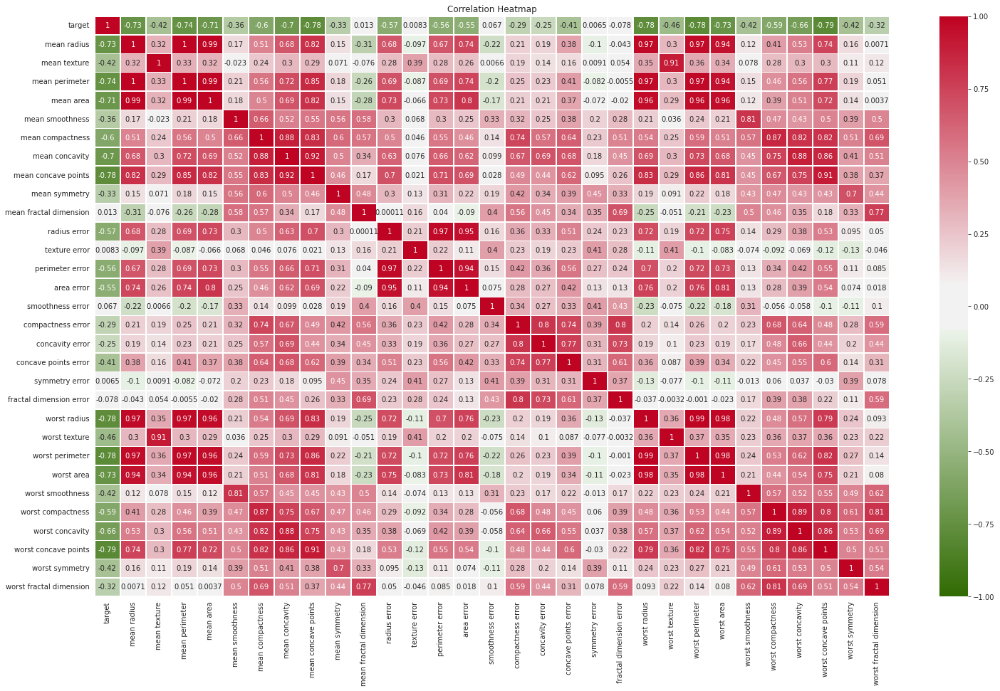

In [ ]:
# Multivariate numerical descriptive statistics

#Correlation Matrix
print("CORRELATION MATRIX\n",df.corr())
print("\n\n")

#Correlation Matrix as a Heatmap
sns.set_style('darkgrid')
plt.figure(figsize = (25,15))
cmap = sns.diverging_palette(120, 10, l = 40, s = 99, sep = 20, center = 'light', as_cmap = True) 
sns.heatmap((df).corr(), vmin = -1, vmax = 1, annot = True, cmap = cmap, lw = .5, linecolor = 'white')
plt.title("Correlation Heatmap")
plt.show()

# Observation: there are quite  number of relatively highly correlated predictors (with the target)

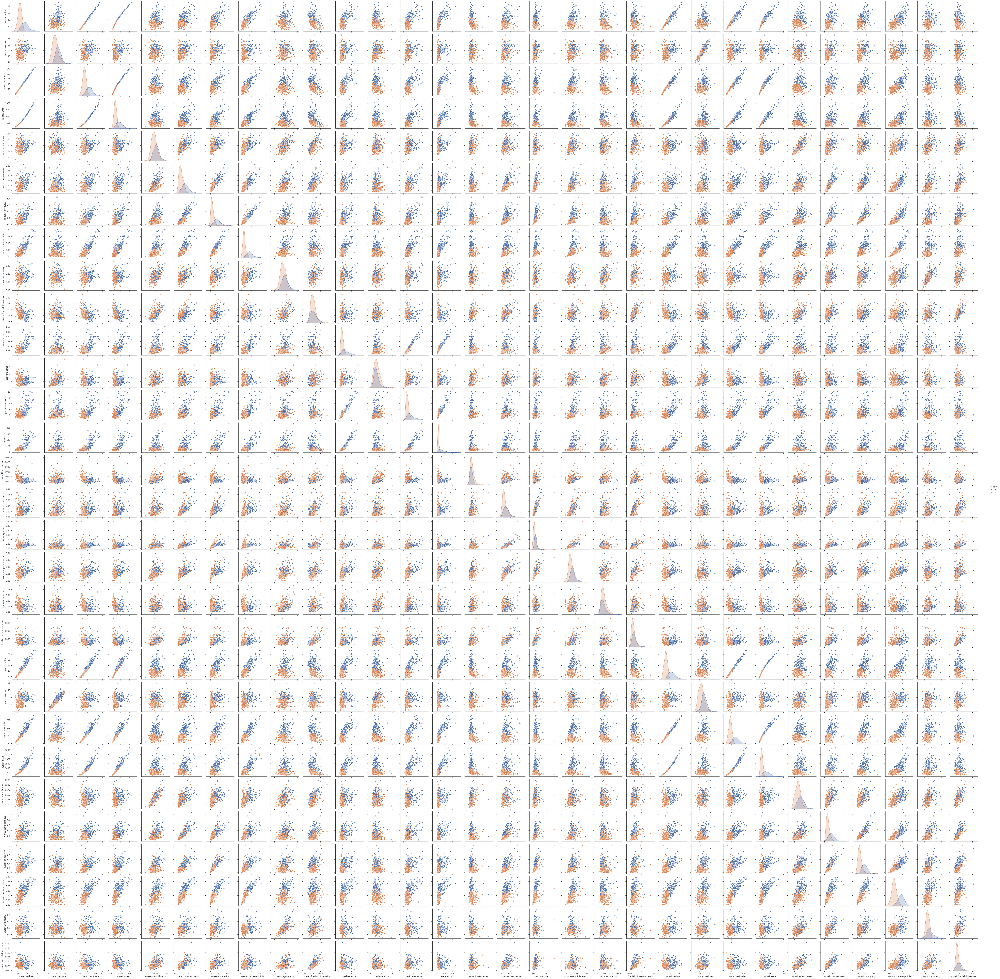

In [ ]:
# Pairplot
# This takes a long time to execute, even on Colab Pro
sns.set_theme(style="ticks")
sns.pairplot(df.sample(300), hue="target",diag_kind='kde')

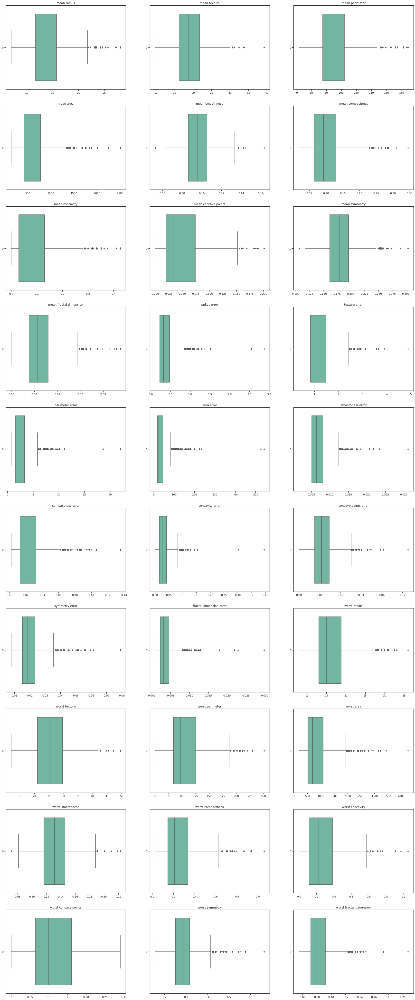

In [ ]:
# Univariate Outliers: 

# Construct the subplot matrix
fig, ax_array = plt.subplots(nrows=10, ncols=3,figsize=(30,30))

# Define arrays to plot on 
ax_array = ax_array.flatten()

# Iteratively plot every variable as a boxplot
for i, ax in enumerate(ax_array):
  sns.boxplot(data=df.iloc[:,i+1], orient="h", palette="Set2", ax = ax)
  # Set the title as the variable name
  ax.set_title(df.columns[i+1])
  fig.subplots_adjust(top=2)

plt.show()

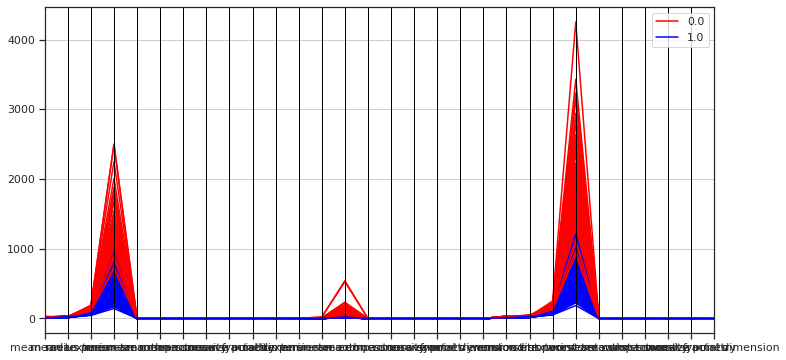

In [ ]:
# Multivariate Outliers (identification using a parallel coordinates plot)
plt.figure(figsize = (12,6))
pd.plotting.parallel_coordinates(
    df, 'target', color=('red', 'blue'))
plt.show()

#**Interactive Visualizations**

In [ ]:
# Plotly
fig = px.scatter_3d(df, z='mean concave points', y='worst perimeter', x='worst area', color='target', hover_name='target')
# build jupyter dash app 
app = JupyterDash(__name__)
# add html components and figure to app
app.layout = html.Div([dcc.Graph(figure=fig)])
# run app inline
app.run_server(mode='inline')



<IPython.core.display.Javascript object>

#**Automated Visualizations**

                                             |          | [  0%]   00:00 -> (? left)


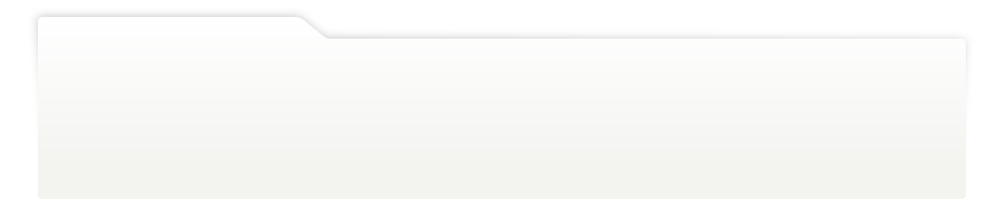
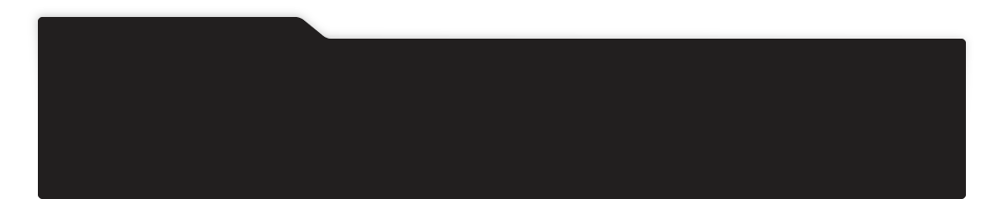
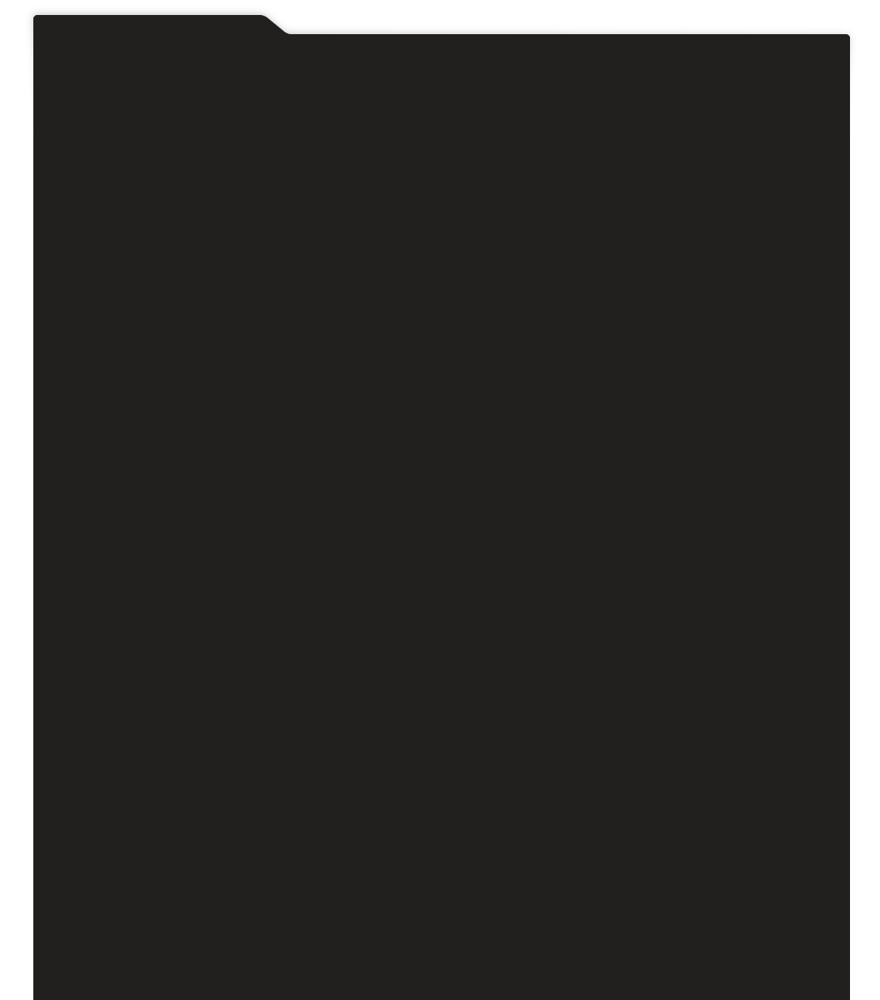
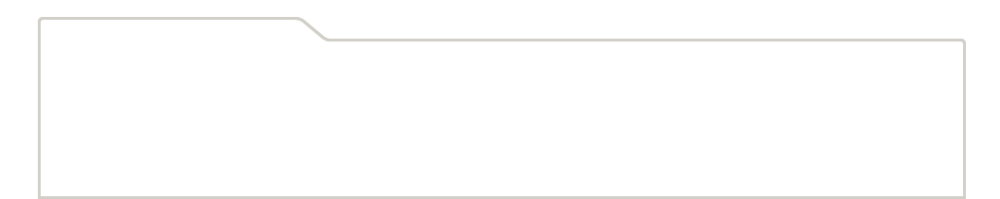
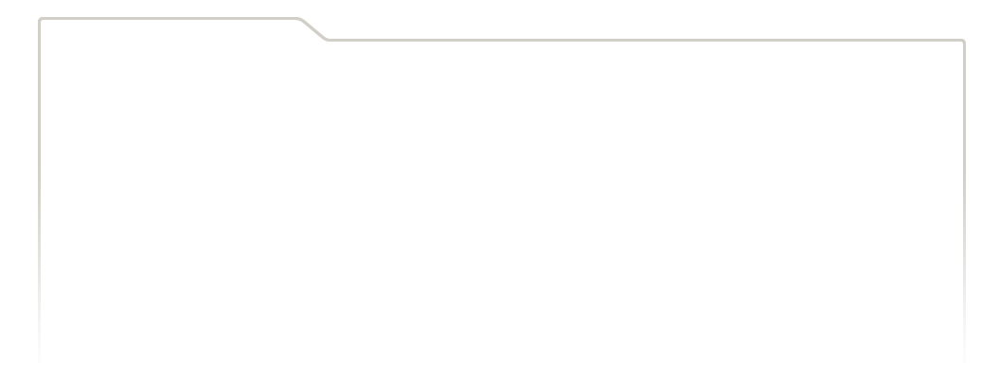
...
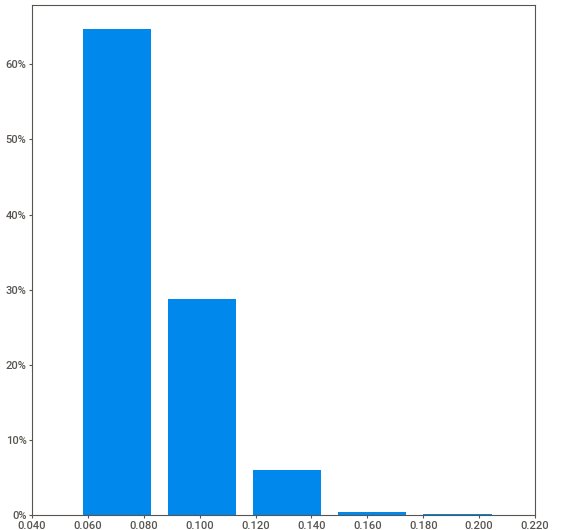
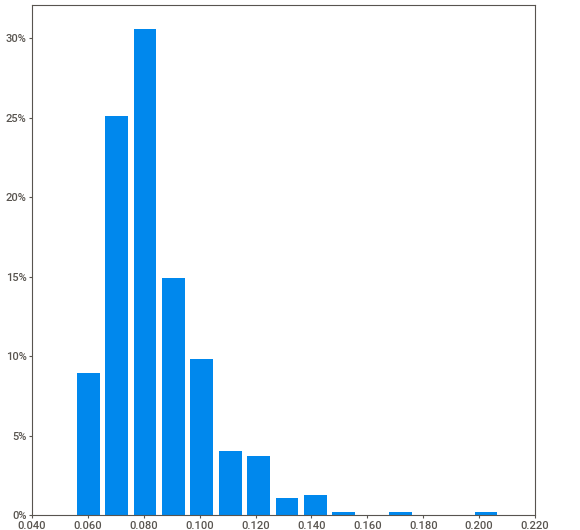
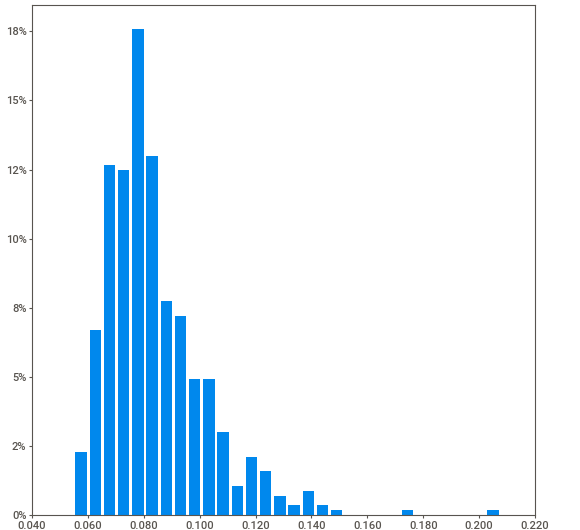
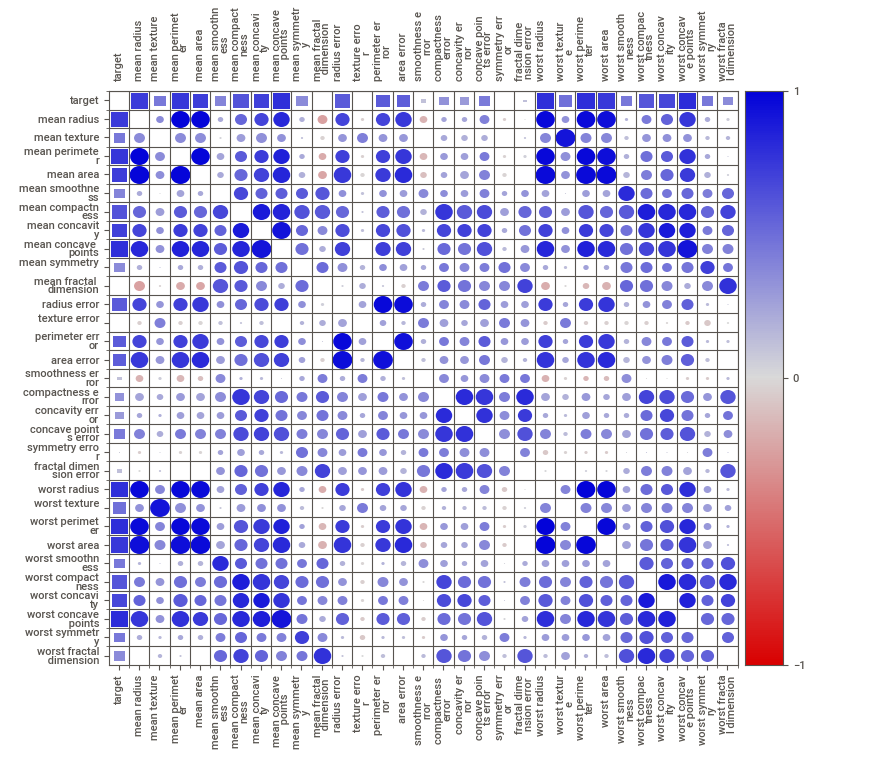
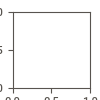

In [ ]:
# Sweetviz as an example of automated visualization

vizreport = sv.analyze(df)              
vizreport.show_notebook(layout='widescreen', w=1500, h=300, scale=0.7) #widescreen layout
#vizreport.show_notebook(layout='vertical', w=800, h=300, scale=0.7)   #vertical layout

In [ ]:
# # AutoViz
# sep = ","
# df.to_csv( "df.csv", index=False, encoding='utf-8-sig')
# file_ = "df.csv"
# dataf = AV.AutoViz(file_, depVar = 'target', sep=",", dfte=None, header=0, verbose=0, lowess=False, chart_format="html", max_rows_analyzed=2000, max_cols_analyzed=20,)

#**Conclusions**
- The dataset is tiny with only 568 instances (and 30 predictors) 
- There are no missing values or duplicates
- Skewness correction would be preferred
- Outliers need to be addressed, likely by winsorizing, because we can scarce afford to throw away any data.
